### Importación de datos



In [152]:
# Importar librerías necesarias
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# 1. Cargar datos desde las URLs
url1 = "https://raw.githubusercontent.com/jvanegas2000/Challenge_Alura_Store/refs/heads/main/data/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/jvanegas2000/Challenge_Alura_Store/refs/heads/main/data/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/jvanegas2000/Challenge_Alura_Store/refs/heads/main/data/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/jvanegas2000/Challenge_Alura_Store/refs/heads/main/data/tienda_4.csv"



tienda1 = pd.read_csv(url1)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

In [153]:
tienda1

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359
...,...,...,...,...,...,...,...,...,...,...,...,...
2354,Iphone 15,Electrónicos,1284400.0,66600.0,15/11/2021,Izabela de León,Medellín,1,Nequi,1,6.25184,-75.56359
2355,Impresora,Electrónicos,282800.0,15300.0,18/03/2023,Lucas Olivera,Bogotá,5,Nequi,1,4.60971,-74.08175
2356,Juego de mesa,Juguetes,122900.0,7200.0,06/07/2021,Lucas Olivera,Cali,5,Tarjeta de crédito,4,3.43722,-76.52250
2357,Cama box,Muebles,691300.0,35000.0,02/05/2022,Pedro Gomez,Pasto,1,Tarjeta de crédito,2,1.21361,-77.28111


#1. Análisis de facturación



In [154]:
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt
import locale

# Configurar el formato de números para separador de miles
locale.setlocale(locale.LC_ALL, '')

# Diccionario auxiliar
dfs = {'Tienda 1': tienda1, 'Tienda 2': tienda2,
       'Tienda 3': tienda3, 'Tienda 4': tienda4}

# Tabla de facturación
facturacion = []
for nombre, df in dfs.items():
    num_ventas = len(df)
    ventas = df['Precio'].sum()
    envio = df['Costo de envío'].sum()
    total = ventas + envio
    facturacion.append([nombre, num_ventas, ventas, envio, total])

# Agregar fila de totales
totales = ['TOTAL',
           sum(f[1] for f in facturacion),
           sum(f[2] for f in facturacion),
           sum(f[3] for f in facturacion),
           sum(f[4] for f in facturacion)]
facturacion.append(totales)

# Títulos de columnas más limpios
headers = [
    'Tienda',
    'N° Ventas',
    'Ventas Totales ($)',
    'Envíos Totales ($)',
    'Facturación Total ($)'
]

print(tabulate(facturacion,
               headers=headers,
               floatfmt=",.0f",
               tablefmt='github'))

| Tienda   |   N° Ventas |   Ventas Totales ($) |   Envíos Totales ($) |   Facturación Total ($) |
|----------|-------------|----------------------|----------------------|-------------------------|
| Tienda 1 |        2359 |        1,150,880,400 |           61,377,900 |           1,212,258,300 |
| Tienda 2 |        2359 |        1,116,343,500 |           59,485,100 |           1,175,828,600 |
| Tienda 3 |        2359 |        1,098,019,600 |           58,516,600 |           1,156,536,200 |
| Tienda 4 |        2358 |        1,038,375,700 |           55,317,400 |           1,093,693,100 |
| TOTAL    |        9435 |        4,403,619,200 |          234,697,000 |           4,638,316,200 |


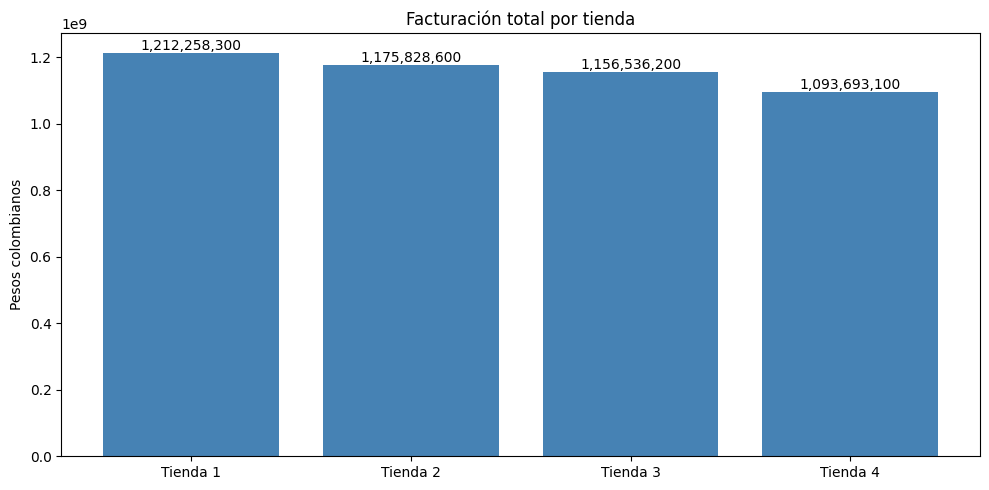

In [155]:
# Gráfico
labels = [f[0] for f in facturacion[:-1]]  # Excluir la fila de totales
totals = [f[4] for f in facturacion[:-1]]  # Excluir la fila de totales

plt.figure(figsize=(10,5))
bars = plt.bar(labels, totals, color='steelblue')

# Agregar etiquetas con separador de miles
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             height,
             locale.format_string('%.0f', height, grouping=True),
             ha='center',
             va='bottom')

plt.title('Facturación total por tienda')
plt.ylabel('Pesos colombianos')
plt.xticks(rotation=0)

# Ajustar márgenes para que se vean completas las etiquetas
plt.tight_layout()
plt.show()

### Conclusión del Análisis de Facturación

El análisis de facturación muestra que, aunque las cuatro tiendas tienen un número de ventas muy similar, existen diferencias notables en los ingresos totales. La Tienda 1 es la que más factura, mientras que la Tienda 4 presenta el menor desempeño tanto en ventas como en facturación total. Por lo tanto, si el objetivo es vender la tienda con menor facturación, la Tienda 4 sería la opción más recomendable.

# 2. Ventas por categoría

In [156]:
from tabulate import tabulate
import matplotlib.pyplot as plt

# Consolidar ventas por categoría y tienda
por_cat = []
for nombre, df in dfs.items():
    tmp = df.groupby('Categoría del Producto')['Precio'].sum().reset_index()
    tmp['Tienda'] = nombre
    por_cat.append(tmp)
por_cat = pd.concat(por_cat)

# Tabla pivote
pivot = por_cat.pivot(index='Categoría del Producto',
                      columns='Tienda',
                      values='Precio').fillna(0).round(0)

# Agregar fila de totales
pivot.loc['TOTAL'] = pivot.sum()

# Mostrar tabla con totales
print(tabulate(pivot.reset_index(),
               headers='keys', tablefmt='github', floatfmt=",.0f"))

|    | Categoría del Producto   |      Tienda 1 |      Tienda 2 |      Tienda 3 |      Tienda 4 |
|----|--------------------------|---------------|---------------|---------------|---------------|
|  0 | Artículos para el hogar  |    12,698,400 |    14,746,900 |    15,060,000 |    15,074,500 |
|  1 | Deportes y diversión     |    39,290,000 |    34,744,500 |    35,593,100 |    33,350,100 |
|  2 | Electrodomésticos        |   363,685,200 |   348,567,800 |   329,237,900 |   283,260,200 |
|  3 | Electrónicos             |   429,493,500 |   410,831,100 |   410,775,800 |   409,476,100 |
|  4 | Instrumentos musicales   |    91,299,000 |   104,990,300 |    77,380,900 |    75,102,400 |
|  5 | Juguetes                 |    17,995,700 |    15,945,400 |    19,401,100 |    20,262,200 |
|  6 | Libros                   |     8,784,900 |    10,091,200 |     9,498,700 |     9,321,300 |
|  7 | Muebles                  |   187,633,700 |   176,426,300 |   201,072,100 |   192,528,900 |
|  8 | TOTAL        

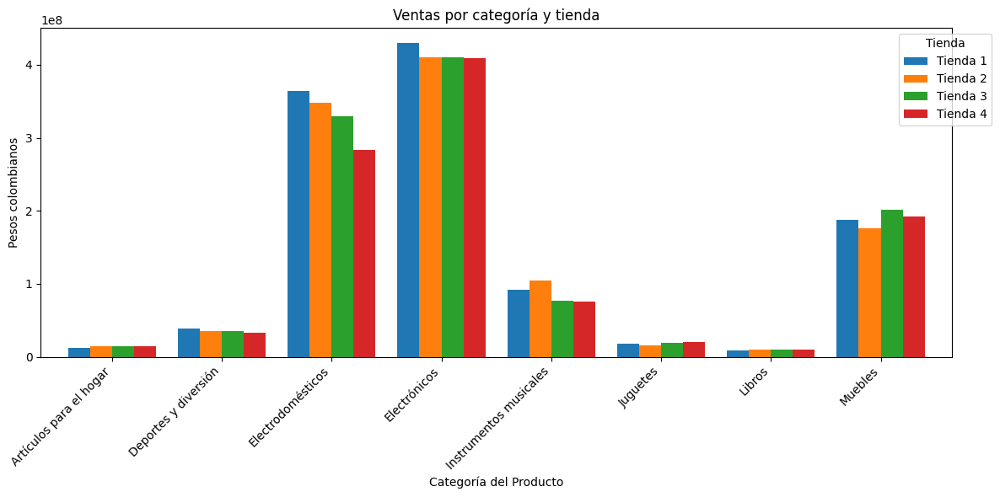

In [157]:
# Gráfico de barras agrupadas
ax = pivot.drop('TOTAL').plot(kind='bar', figsize=(12,6), width=0.8)
plt.title('Ventas por categoría y tienda')
plt.xlabel('Categoría del Producto')
plt.ylabel('Pesos colombianos')
plt.legend(title='Tienda', bbox_to_anchor=(1.05, 1))
plt.xticks(rotation=45, ha='right')

# Ajustar márgenes para que se vean todas las etiquetas
plt.tight_layout()
plt.show()

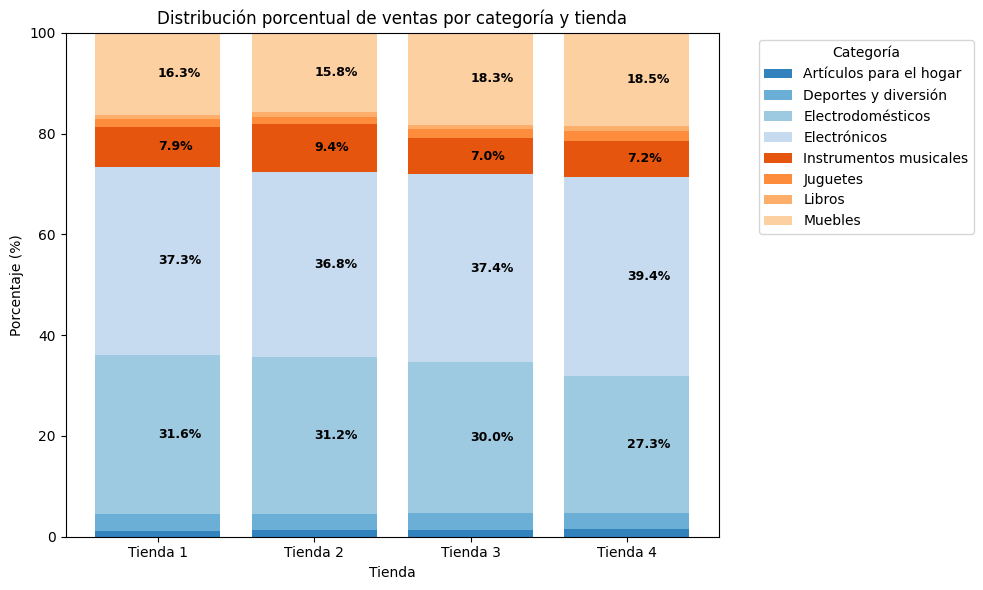

In [158]:
import matplotlib.pyplot as plt
import numpy as np

# Excluir la fila TOTAL para el gráfico
pivot_pct = pivot.drop('TOTAL')

# Calcular el porcentaje por tienda
pivot_pct = pivot_pct.div(pivot_pct.sum(axis=0), axis=1) * 100

# Colores iguales al gráfico anterior
colors = plt.get_cmap('tab20c').colors

fig, ax = plt.subplots(figsize=(10,6))

bottom = np.zeros(len(pivot_pct.columns))
bars = []
for i, categoria in enumerate(pivot_pct.index):
    bar = ax.bar(
        pivot_pct.columns,
        pivot_pct.loc[categoria],
        bottom=bottom,
        label=categoria,
        color=colors[i % len(colors)]
    )
    bars.append(bar)
    # Etiquetas a la derecha de cada segmento
    for j, (x, y, b) in enumerate(zip(pivot_pct.columns, pivot_pct.loc[categoria], bottom)):
        if y > 5:  # Solo mostrar etiquetas si el segmento es mayor al 5%
            ax.text(j, b + y/2, f'{y:.1f}%', ha='left', va='center', fontsize=9, color='black', fontweight='bold')
    bottom += pivot_pct.loc[categoria].values

ax.set_title('Distribución porcentual de ventas por categoría y tienda')
ax.set_ylabel('Porcentaje (%)')
ax.set_xlabel('Tienda')
ax.set_ylim(0, 100)
ax.legend(title='Categoría', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

### Conclusión del Análisis de Ventas por Categoría

El análisis de ventas por categoría muestra que la mayor parte de los ingresos en todas las tiendas proviene de las categorías **Electrónicos** y **Electrodomésticos**, seguidas por **Muebles**. La Tienda 1 lidera en la mayoría de las categorías principales, especialmente en Electrónicos y Electrodomésticos, mientras que la Tienda 4 tiene los valores más bajos en casi todas las categorías. Las categorías con menor facturación son **Libros** y **Artículos para el hogar** en todas las tiendas. Esto refuerza la tendencia observada en la facturación total, donde la Tienda 4 presenta el menor desempeño general.

# 3. Calificación promedio de la tienda


In [159]:
from tabulate import tabulate
import matplotlib.pyplot as plt
import numpy as np

# Estadísticas descriptivas de calificaciones por tienda
stats = []
for nombre, df in dfs.items():
    promedio = df['Calificación'].mean()
    mediana = df['Calificación'].median()
    desv = df['Calificación'].std()
    stats.append([nombre, promedio, mediana, desv])

headers = ['Tienda', 'Calificación promedio', 'Calificación mediana', 'Desviación estándar']

print(tabulate(stats,
               headers=headers,
               floatfmt=".2f", tablefmt='github'))

| Tienda   |   Calificación promedio |   Calificación mediana |   Desviación estándar |
|----------|-------------------------|------------------------|-----------------------|
| Tienda 1 |                    3.98 |                   5.00 |                  1.42 |
| Tienda 2 |                    4.04 |                   5.00 |                  1.36 |
| Tienda 3 |                    4.05 |                   5.00 |                  1.39 |
| Tienda 4 |                    4.00 |                   5.00 |                  1.40 |


In [160]:
# Mostrar distribución de frecuencias de calificaciones por tienda
print("\nDistribución de frecuencias de calificaciones por tienda:")
freq_table = []
for nombre, df in dfs.items():
    conteo = df['Calificación'].value_counts().sort_index()
    porcentajes = (conteo / len(df) * 100).round(2)
    freq_table.append([nombre] + list(porcentajes))

freq_headers = ['Tienda', '1 estrella (%)', '2 estrellas (%)', '3 estrellas (%)', '4 estrellas (%)', '5 estrellas (%)']

print(tabulate(freq_table,
               headers=freq_headers,
               floatfmt=".2f",
               tablefmt='github'))


Distribución de frecuencias de calificaciones por tienda:
| Tienda   |   1 estrella (%) |   2 estrellas (%) |   3 estrellas (%) |   4 estrellas (%) |   5 estrellas (%) |
|----------|------------------|-------------------|-------------------|-------------------|-------------------|
| Tienda 1 |            13.52 |              3.65 |              9.24 |             18.82 |             54.77 |
| Tienda 2 |            11.57 |              3.94 |              8.86 |             20.43 |             55.19 |
| Tienda 3 |            12.59 |              3.35 |              8.18 |             18.40 |             57.48 |
| Tienda 4 |            13.15 |              3.60 |              8.91 |             19.21 |             55.13 |


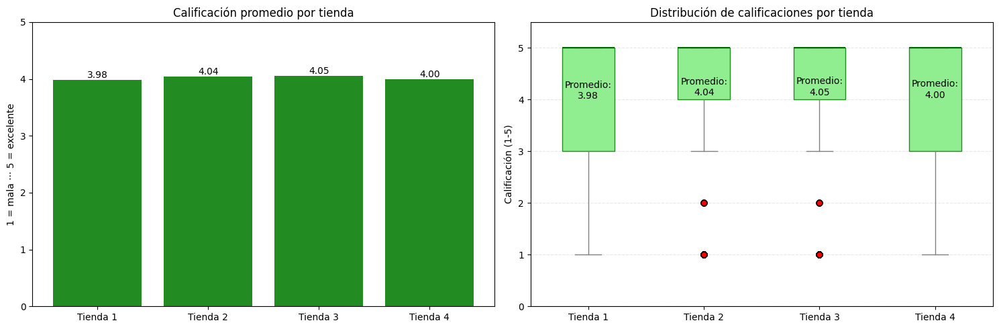

In [161]:
# Crear figura con dos subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))

# Gráfico de barras
labels = [s[0] for s in stats]
bars = ax1.bar(labels, [s[1] for s in stats], color='forestgreen')
ax1.set_ylim(0,5)
ax1.set_ylabel('1 = mala ··· 5 = excelente')
ax1.set_title('Calificación promedio por tienda')
ax1.bar_label(bars, fmt='%.2f')

# Boxplot
data = [df['Calificación'] for df in dfs.values()]
bp = ax2.boxplot(data, tick_labels=dfs.keys(), patch_artist=True,
            boxprops=dict(facecolor='lightgreen', color='forestgreen'),
            medianprops=dict(color='darkgreen', linewidth=1.5),
            whiskerprops=dict(color='gray'),
            capprops=dict(color='gray'),
            flierprops=dict(markerfacecolor='red', marker='o', markersize=6, alpha=0.5))

ax2.set_title('Distribución de calificaciones por tienda')
ax2.set_ylabel('Calificación (1-5)')
ax2.grid(axis='y', linestyle='--', alpha=0.3)
ax2.set_ylim(0,5.5)

# Agregar etiquetas con los valores promedio
medias = [np.mean(d) for d in data]
for i, media in enumerate(medias, 1):
    ax2.text(i, media, f'Promedio:\n{media:.2f}',
             horizontalalignment='center', verticalalignment='bottom')

plt.tight_layout()
plt.show()

### Conclusión del Análisis de Calificación Promedio

El análisis de las calificaciones muestra que todas las tiendas mantienen un alto nivel de satisfacción del cliente, con promedios cercanos a 4 sobre 5 y una mediana de 5 en todos los casos. Sin embargo, la presencia de calificaciones bajas en todas las tiendas reduce el promedio y genera una desviación estándar de aproximadamente 1.4. Esto indica que, aunque la mayoría de los clientes otorgan la máxima calificación, existe un grupo menor que ha tenido experiencias menos satisfactorias. En general, la percepción del cliente es positiva y bastante homogénea entre las tiendas.

# 4. Productos más y menos vendidos

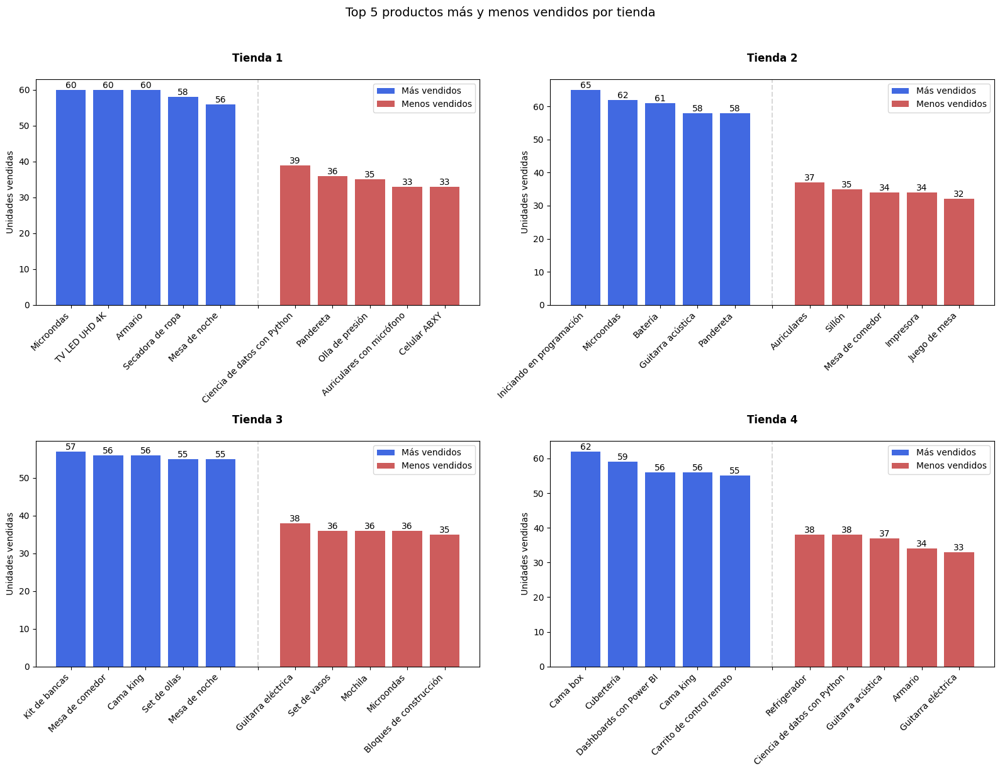

In [162]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, (nombre, df) in enumerate(dfs.items()):
    # Obtener top 5 más y menos vendidos
    conteo = df['Producto'].value_counts()
    top5 = conteo.head(5)
    bottom5 = conteo.tail(5)

    # Crear las barras
    x = range(5)
    bars1 = axes[idx].bar(x, top5.values, color='royalblue', label='Más vendidos')
    bars2 = axes[idx].bar([i+6 for i in x], bottom5.values, color='indianred', label='Menos vendidos')

    # Configurar el gráfico
    axes[idx].set_title(f'{nombre}', pad=20, fontsize=12, fontweight='bold')
    axes[idx].set_ylabel('Unidades vendidas')

    # Configurar las etiquetas del eje x
    all_labels = list(top5.index) + [''] + list(bottom5.index)
    axes[idx].set_xticks(list(x) + [5] + [i+6 for i in x])
    axes[idx].set_xticklabels(all_labels, rotation=45, ha='right')

    # Agregar las etiquetas de valores
    axes[idx].bar_label(bars1)
    axes[idx].bar_label(bars2)

    # Agregar leyenda
    axes[idx].legend()

    # Agregar una línea vertical separadora
    axes[idx].axvline(x=5, color='gray', linestyle='--', alpha=0.3)

plt.suptitle('Top 5 productos más y menos vendidos por tienda', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

### Conclusión del Análisis de Productos Más y Menos Vendidos

El análisis de los productos más y menos vendidos revela patrones interesantes en cada tienda. Si bien hay algunos productos que consistentemente se encuentran entre los más vendidos en todas las tiendas, también existen diferencias notables en los productos menos populares. Esta información puede ser valiosa para ajustar el inventario, identificar oportunidades de promoción y comprender mejor las preferencias de los clientes en cada ubicación.

# 5. Envío promedio por tienda

In [163]:
from tabulate import tabulate
import matplotlib.pyplot as plt
import numpy as np

# Tabla de envío promedio y desviación estándar por tienda
stats = []
for nombre, df in dfs.items():
    promedio = df['Costo de envío'].mean()
    desv = df['Costo de envío'].std()
    stats.append([nombre, promedio, desv])

print(tabulate(stats,
               headers=['Tienda', 'Costo envío promedio ($)', 'Desviación estándar ($)'],
               floatfmt=",.0f", tablefmt='github'))

| Tienda   |   Costo envío promedio ($) |   Desviación estándar ($) |
|----------|----------------------------|---------------------------|
| Tienda 1 |                     26,019 |                    32,860 |
| Tienda 2 |                     25,216 |                    31,741 |
| Tienda 3 |                     24,806 |                    30,946 |
| Tienda 4 |                     23,459 |                    30,279 |


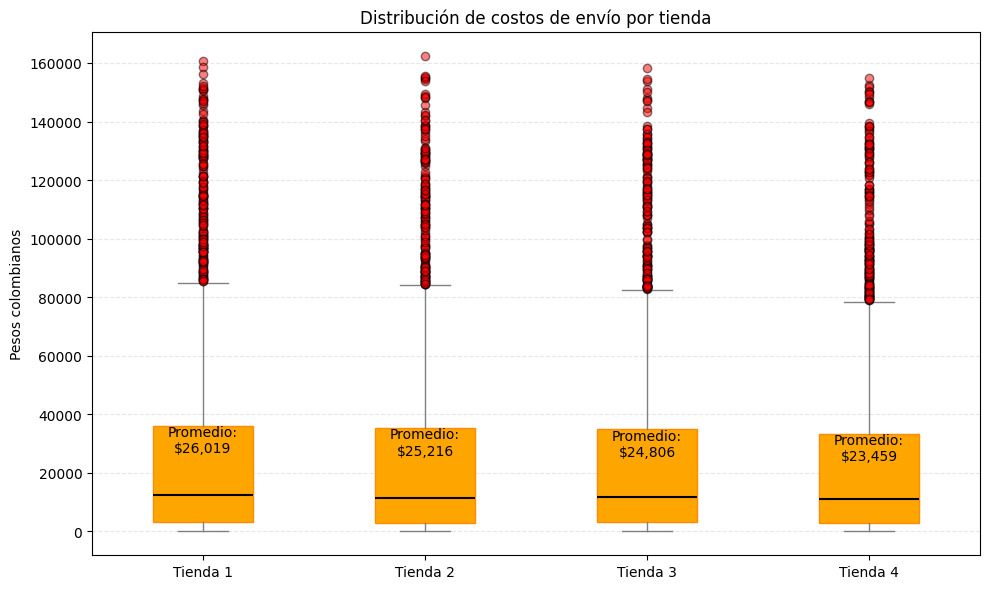

In [164]:
# Boxplot de la distribución de costos de envío por tienda
plt.figure(figsize=(10,6))
data = [df['Costo de envío'] for df in dfs.values()]
bp = plt.boxplot(data, tick_labels=dfs.keys(), patch_artist=True,
            boxprops=dict(facecolor='orange', color='darkorange'),
            medianprops=dict(color='black', linewidth=1.5),
            whiskerprops=dict(color='gray'),
            capprops=dict(color='gray'),
            flierprops=dict(markerfacecolor='red', marker='o', markersize=6, alpha=0.5))

plt.title('Distribución de costos de envío por tienda')
plt.ylabel('Pesos colombianos')
plt.grid(axis='y', linestyle='--', alpha=0.3)

# Agregar etiquetas con los valores promedio
medias = [np.mean(d) for d in data]
for i, media in enumerate(medias, 1):
    plt.text(i, media, f'Promedio:\n${media:,.0f}',
             horizontalalignment='center', verticalalignment='bottom')

plt.tight_layout()
plt.show()

### Conclusión del Análisis de Envío Promedio por Tienda

El análisis muestra que el costo de envío promedio es bastante similar entre las cuatro tiendas, con valores que oscilan entre $23,459 y $26,019. La Tienda 1 presenta el costo de envío promedio más alto, mientras que la Tienda 4 tiene el más bajo. La desviación estándar también es similar en todas las tiendas (alrededor de $30,000), lo que indica que la variabilidad en los costos de envío es comparable entre ellas. En resumen, no existen diferencias significativas en la política de envíos entre las tiendas, por lo que este aspecto no sería determinante para decidir cuál vender.

# Conclusión General: ¿Qué tienda debería vender el Señor Juan?

Tras analizar los datos de las cuatro tiendas en los aspectos de facturación, ventas por categoría, calificación promedio, productos más y menos vendidos, y costos de envío, se pueden extraer las siguientes conclusiones:

1. **Facturación total:** La Tienda 4 presenta la facturación total más baja, tanto en ventas como en ingresos por envíos, mientras que la Tienda 1 lidera en este aspecto. Las diferencias, aunque no son abismales, son consistentes y relevantes para la toma de decisiones.

2. **Ventas por categoría:** En casi todas las categorías principales (Electrónicos, Electrodomésticos, Muebles), la Tienda 4 también muestra los valores más bajos de ventas, lo que refuerza la tendencia observada en la facturación total.

3. **Calificación promedio:** Todas las tiendas tienen calificaciones promedio y medianas muy similares, con una mayoría de clientes satisfechos (mediana 5 y promedio cercano a 4). No hay diferencias significativas en la percepción del cliente que justifiquen la venta de una tienda sobre otra.

4. **Productos más y menos vendidos:** La Tienda 4 no destaca en los productos más vendidos y, al igual que en los otros puntos, muestra menor volumen en los productos populares. Esto sugiere menor rotación de inventario y menor dinamismo comercial.

5. **Envío promedio:** Los costos de envío promedio y su variabilidad son muy similares entre todas las tiendas, por lo que este factor no es determinante para la decisión.

**Recomendación:**  
Considerando todos los análisis, la **Tienda 4** es la que muestra un desempeño menor de manera consistente en facturación, ventas por categoría y rotación de productos. Dado que la satisfacción del cliente y los costos de envío son similares en todas las tiendas, vender la Tienda 4 sería la opción más lógica para el Señor Juan si busca desprenderse de la tienda menos rentable y con menor potencial de crecimiento.

> **En resumen:**  
> Se recomienda vender la Tienda 4, ya que es la que presenta el desempeño más bajo en los indicadores clave analizados.

# ¡Extra! Análisis del desempeño geográfico

In [165]:
#Consolidar los datos de todas las tiendas

import pandas as pd

# Añadir columna de tienda a cada DataFrame
t1 = tienda1.copy(); t1['Tienda'] = 'Tienda 1'
t2 = tienda2.copy(); t2['Tienda'] = 'Tienda 2'
t3 = tienda3.copy(); t3['Tienda'] = 'Tienda 3'
t4 = tienda4.copy(); t4['Tienda'] = 'Tienda 4'

# Unir todos los datos
df_all = pd.concat([t1, t2, t3, t4], ignore_index=True)

### Gráfico de dispersión de ventas por ubicación

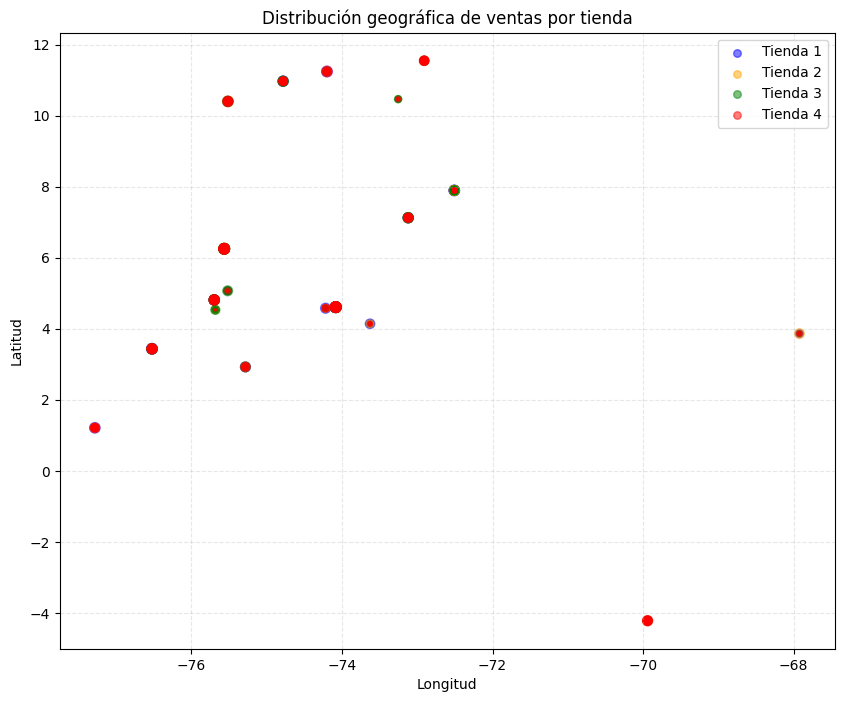

In [166]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
for tienda, color in zip(df_all['Tienda'].unique(), ['blue', 'orange', 'green', 'red']):
    subset = df_all[df_all['Tienda'] == tienda]
    plt.scatter(subset['lon'], subset['lat'],
                s=subset['Precio']/50000,  # tamaño proporcional al valor de la venta
                alpha=0.5, label=tienda, c=color)

plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.title('Distribución geográfica de ventas por tienda')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()

### Mapa de calor de concentración de ventas

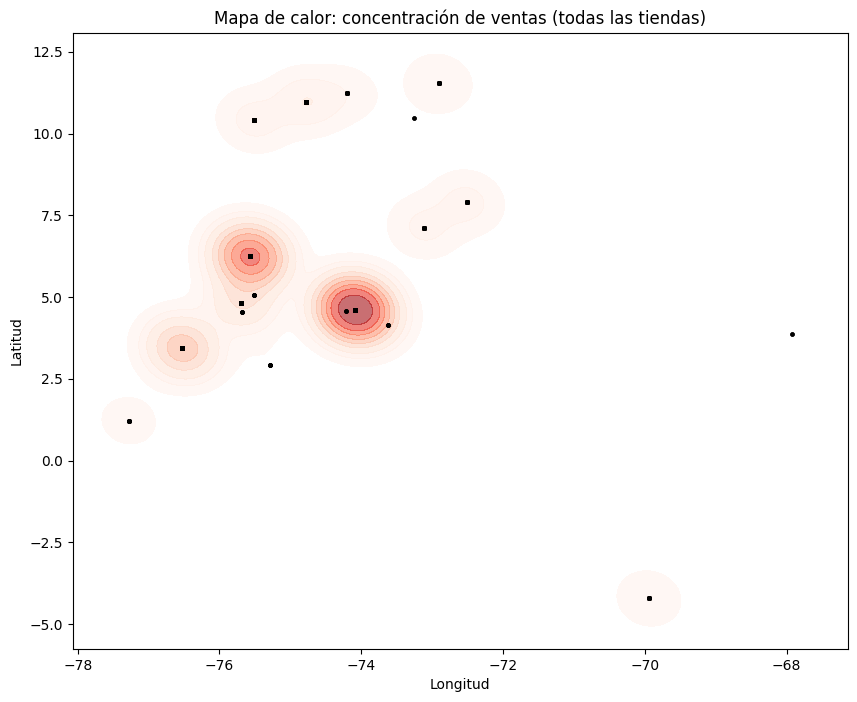

In [167]:
import seaborn as sns

plt.figure(figsize=(10,8))
sns.kdeplot(
    x=df_all['lon'], y=df_all['lat'],
    weights=df_all['Precio'],
    cmap="Reds", fill=True, thresh=0.05, alpha=0.6
)
plt.scatter(df_all['lon'], df_all['lat'], s=5, c='black', alpha=0.2)
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.title('Mapa de calor: concentración de ventas (todas las tiendas)')
plt.show()

### Mapa interactivo con Folium

In [168]:
import folium

# Crear mapa centrado en Colombia
m = folium.Map(location=[4.6, -74.1], zoom_start=5)

# Agregar puntos de ventas
for _, row in df_all.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=max(row['Precio']/200000, 2),
        color='blue' if row['Tienda']=='Tienda 1' else
              'orange' if row['Tienda']=='Tienda 2' else
              'green' if row['Tienda']=='Tienda 3' else 'red',
        fill=True, fill_opacity=0.4,
        popup=f"{row['Tienda']}<br>{row['Lugar de Compra']}<br>${row['Precio']:,.0f}"
    ).add_to(m)

m  # En Colab, esto mostrará el mapa interactivo